In [2]:
import torch
import pandas as pd
import os
import torch.nn as nn

In [3]:
import sys
sys.path.append("/home/lchanch/model_training")
import early_stopping

In [4]:
import sys
sys.path.append("/home/lchanch")
import networks

In [6]:
import sys
sys.path.append("/home/lchanch/model_training")
from LRP import ISNetFlexTorch
from LRP import LRPDenseNetZe

from PIL import Image
import matplotlib.pyplot as plt
from matplotlib import colors
from torchvision import transforms

In [13]:
def load_densenet_lrp_weights(
    model,
    checkpoint_state_dict,
    *,
    strict=False,
    verbose=True
):
    """
    Loads DenseNet weights into an LRP-compatible DenseNet.
    Supports:
        - ERM checkpoints
        - ISNetDANN checkpoints
    Ignores adversarial / explanation-specific modules.
    """

    clean_state_dict = {}

    # ---- Detectar tipo de checkpoint ----
    is_isnet = any(
        k.startswith("isnet_network.network.model.")
        for k in checkpoint_state_dict.keys()
    )

    is_erm = any(
        k.startswith("featurizer.network.")
        for k in checkpoint_state_dict.keys()
    )

    if not (is_isnet or is_erm):
        raise ValueError("Checkpoint no reconocido (ni ERM ni ISNetDANN)")

    if verbose:
        print(
            "🔹 Detectado checkpoint",
            "ISNetDANN" if is_isnet else "ERM"
        )

    # ---- ERM ----
    if is_erm:
        for k, v in checkpoint_state_dict.items():

            # Backbone
            if k.startswith("featurizer.network.features."):
                new_k = k.replace(
                    "featurizer.network.features.",
                    "features."
                )
                clean_state_dict[new_k] = v

            # Classifier
            elif k.startswith("classifier."):
                clean_state_dict[k] = v

    # ---- ISNetDANN ----
    elif is_isnet:
        for k, v in checkpoint_state_dict.items():

            # Backbone
            if k.startswith("isnet_network.network.model.features."):
                new_k = k.replace(
                    "isnet_network.network.model.features.",
                    "features."
                )
                clean_state_dict[new_k] = v

            # Classifier
            elif k.startswith(
                "isnet_network.network.model.classifier."
            ):
                new_k = k.replace(
                    "isnet_network.network.model.",
                    ""
                )
                clean_state_dict[new_k] = v

    # ---- Cargar pesos ----
    missing, unexpected = model.load_state_dict(
        clean_state_dict,
        strict=strict
    )

    if verbose:
        print("✅ Pesos cargados en DenseNet LRP")
        print("Missing keys:", missing)
        print("Unexpected keys:", unexpected)

    return model


In [ ]:
#-----LRP Flex proposed in Faster ISNets for visualization-------

In [9]:
#transforms
geom_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
])

def transform_image_tensor_rgb(image_path):
    img = Image.open(image_path).convert('RGB')

    img = geom_transform(img)   # MISMA geometría
    img = transforms.ToTensor()(img)
    img = transforms.Normalize(
        [0.5307, 0.5307, 0.5307],
        [0.2583, 0.2583, 0.2583]
    )(img)

    return img.unsqueeze(0).float()

def transform_image_for_display(image_path):
    img = Image.open(image_path).convert("RGB")
    img = geom_transform(img)   # MISMA geometría
    return img

In [27]:
def LRPFlex_visualize(img_path, densenet, ex_class=1):

    img_tensor = transform_image_tensor_rgb(img_path)

    net = ISNetFlexTorch.ISNetFlex(
        model=densenet,
        architecture='densenet121',     #write architecture name only for densenet, resnet and VGG
        selective=True,                 #Selective - Faster ISNet
        Zb=True,                        #regla de propagación
        multiple=False,                 #No produce LRP maps por clase y por sample, sino solo 1 por muestra
        HiddenLayerPenalization=False,  #No se aplica penalización por relevancia (solo se explica)
        randomLogit=False,              #No usa logits aleatorios
        explainLabels=True              #set explainLabels=False when defining ISNet #Genera el mapa de relevancia para una clase específica
    )

    #Ejecutar inferencia y obtener relevancia
    out = net(img_tensor, runLRPFlex=True, labels=torch.tensor([ex_class])) #activa la explicación (propagación de relevancia). #especifica que se quiere explicar una clase epseficica.
    logits = out['output'] #logits del modelo, son 2 por lo que es claificacion bianria
    heatmap = out['LRPFlex']['input'] #mapa de relevancia generado sobre la imagen de entrada.

    # Preparar imagen original recortada
    img_display = transform_image_for_display(img_path)

    #Preparar heatmap
    h = heatmap.squeeze().mean(0).detach().numpy() #elimina dimensiones extras. #promedia la relevancia sobre los canales (queda una imagen 2D)
    norm = colors.TwoSlopeNorm(vmin=h.min(), vcenter=0, vmax=h.max()) #permite ver las regiones positivas (relevancia) y negativas


    # Mostrar imagen original
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Imagen original
    axes[0].imshow(img_display)
    axes[0].axis("off")
    axes[0].set_title("Original Image")

    # Heatmap
    im = axes[1].imshow(h, cmap='RdBu_r', norm=norm, interpolation='nearest')
    #axes[1].axis("off")
    axes[1].set_title(f"LRP heatmap (Class {ex_class})")

    plt.tight_layout()
    plt.show()

In [ ]:
#Create densenet adapted to lrp

In [28]:
densenet_lrp_erm = LRPDenseNetZe.densenet121(pretrained=False, num_classes=2)
densenet_lrp_isnet = LRPDenseNetZe.densenet121(pretrained=False, num_classes=2) 

In [29]:
#best models (baseline and mitigation) for the setting No Finding-Sex
model_path_erm="/home/lchanch/initial_training/output_sweep_12/grid_sex_mimic_12/8567bca8c4876916928b7465a52cdeae"
model_path_isnet="/home/lchanch/model_training/ISNetDANN/train/grid_sex_ISNetDANN/e71e3c622a942657993e10cf0b5e652b"

In [31]:
#Load weights
checkpoint_ERM = torch.load(os.path.join(model_path_erm, "model.best.pkl"))
state_dict_ERM = checkpoint_ERM['model_dict']
densenet_w_ERM = load_densenet_lrp_weights(densenet_lrp_erm, state_dict_ERM, strict=True)

checkpoint_ISNetDANN = torch.load(os.path.join(model_path_isnet, "model.best.pkl"))
state_dict_ISNetDANN = checkpoint_ISNetDANN['model_dict']
densenet_w_ISNetDANN = load_densenet_lrp_weights(densenet_lrp_isnet, state_dict_ISNetDANN, strict=True)

/tmp/ipykernel_1105572/4115355979.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint_ERM = torch.load(os.path.join(model_path_erm, "model.best.pkl"))
/tmp/ipyker

🔹 Detectado checkpoint ERM
✅ Pesos cargados en DenseNet LRP
Missing keys: []
Unexpected keys: []
🔹 Detectado checkpoint ISNetDANN
✅ Pesos cargados en DenseNet LRP
Missing keys: []
Unexpected keys: []


In [15]:
#Load DF for evaluation
no_findinfg_df_0 = pd.read_csv("/home/lchanch/df_construction_mapping/No_Finding_sample_0")
no_findinfg_df_1 = pd.read_csv("/home/lchanch/df_construction_mapping/No_Finding_sample_1")
df_no_finding = pd.concat([no_findinfg_df_0, no_findinfg_df_1], axis=0)
df_no_finding

,dicom_id,subject_id,study_id,reduced_path,path,ViewPosition,No Finding,Pleural Effusion,Cardiomegaly,Pneumothorax,sex,race,sex_race,age,split,Left Lung,Right Lung,Heart,Width,Height
0,38b272b1-95d11b0b-d9c36864-4843fa28-7ca32a7e,14410216,51976124,p14/p14410216/s51976124/38b272b1-95d11b0b-d9c3...,/home/lchanch/initial_image_prepro/downsample_...,PA,0.0,1.0,0.0,0.0,0,0,1,3,0,349986 5 351940 16 353894 27 355848 39 357803 ...,353414 8 355366 24 357318 39 359270 55 361222 ...,1239607 63 1241563 78 1243519 94 1245474 110 1...,1960,2021
1,fb5ed699-36a47a6a-0b6c442d-2f5b18ba-b2616ef8,17281354,55412015,p17/p17281354/s55412015/fb5ed699-36a47a6a-0b6c...,/home/lchanch/initial_image_prepro/downsample_...,PA,0.0,0.0,0.0,0.0,1,1,2,2,1,554863 6 556882 18 558901 30 560920 42 562939 ...,501906 6 503917 19 505928 33 507939 46 509950 ...,1502596 67 1504601 84 1506607 101 1508612 118 ...,2021,1778
2,ecfd7323-259c293b-d1358c3c-fa4705fd-bbdc1601,12554679,54581115,p12/p12554679/s54581115/ecfd7323-259c293b-d135...,/home/lchanch/initial_image_prepro/downsample_...,PA,0.0,0.0,0.0,1.0,1,0,0,2,0,684664 7 686683 21 688701 36 690720 49 692739 ...,558840 17 560832 51 562837 71 564857 77 566876...,1537681 56 1539698 73 1541716 89 1543733 106 1...,2022,2022
3,e187920f-a699e5d5-4da9d7b0-64f30d89-a7b31b1e,18952096,54875267,p18/p18952096/s54875267/e187920f-a699e5d5-4da9...,/home/lchanch/initial_image_prepro/downsample_...,PA,0.0,1.0,1.0,0.0,1,3,6,2,0,819708 70 821727 76 823747 81 825766 88 827785...,819224 10 821228 31 823233 51 825237 72 827249...,1716818 23 1718825 69 1720831 157 1722838 173 ...,2021,1768
4,993fcd2d-4d1af27e-36f30b75-a6e2db92-2ff06416,19319851,50590294,p19/p19319851/s50590294/993fcd2d-4d1af27e-36f3...,/home/lchanch/initial_image_prepro/downsample_...,AP,0.0,0.0,0.0,0.0,1,2,4,1,0,1657843 9 1660372 26 1662901 44 1665437 54 166...,1679982 6 1682520 16 1685058 27 1687596 38 169...,2901522 193 2904063 209 2906604 225 2909145 24...,2544,3056
5,7bae67c7-369f4989-47abe274-e13a05f8-150e4c9b,13082017,56960485,p13/p13082017/s56960485/7bae67c7-369f4989-47ab...,/home/lchanch/initial_image_prepro/downsample_...,PA,0.0,0.0,0.0,0.0,0,0,1,0,0,436819 6 438548 17 440277 28 442006 39 443736 ...,504034 6 505763 18 507493 28 509222 40 510951 ...,1224756 56 1226485 71 1228214 85 1229943 99 12...,1736,2022
6,d5de5df6-7b0ff80f-3eb22915-2c7c453e-88d3a68b,14886080,52360041,p14/p14886080/s52360041/d5de5df6-7b0ff80f-3eb2...,/home/lchanch/initial_image_prepro/downsample_...,AP,0.0,0.0,1.0,0.0,1,0,0,0,0,782663 14 785182 42 787701 70 790232 86 792775...,685430 5 687967 14 690503 25 693040 34 695577 ...,2893864 104 2896402 138 2898940 172 2901477 19...,2544,3056
7,9e72ea55-8332709e-47f32287-cda6a7a3-964844ee,15052507,52951163,p15/p15052507/s52951163/9e72ea55-8332709e-47f3...,/home/lchanch/initial_image_prepro/downsample_...,AP,0.0,0.0,1.0,0.0,0,0,1,1,0,708895 92 711437 97 713979 101 716521 106 7190...,517520 5 520057 16 522594 26 525131 36 527668 ...,2339298 9 2341832 28 2344366 47 2346900 66 234...,2544,3056
8,f85cd676-85072072-61a4215f-370203af-d3d47751,12118886,57421584,p12/p12118886/s57421584/f85cd676-85072072-61a4...,/home/lchanch/initial_image_prepro/downsample_...,AP,0.0,0.0,0.0,0.0,1,3,6,1,0,597278 3 600322 11 603366 19 606410 26 609454 ...,206020 10 209065 31 212109 53 215154 74 218199...,2204032 12 2207066 35 2210100 57 2213133 81 22...,3050,2539
9,e1eb229a-e95ccc63-10c1b044-f2879113-93b344b9,13244322,52901687,p13/p13244322/s52901687/e1eb229a-e95ccc63-10c1...,/home/lchanch/initial_image_prepro/downsample_...,AP,0.0,0.0,1.0,0.0,0,1,3,0,2,1098966 84 1102020 89 1105074 93 1108128 98 11...,1006563 8 1009609 22 1012654 38 1015700 52 101...,2978038 8 2981089 25 2984139 42 2987190 59 299...,3056,2544


In [ ]:
#---------Apply LRP Flex ERM

In [32]:
print("ERM model id:", id(densenet_w_ERM))
print("ISNetDANN model id:", id(densenet_w_ISNetDANN))


ERM model id: 134953952205440
ISNetDANN model id: 134953967532976


Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


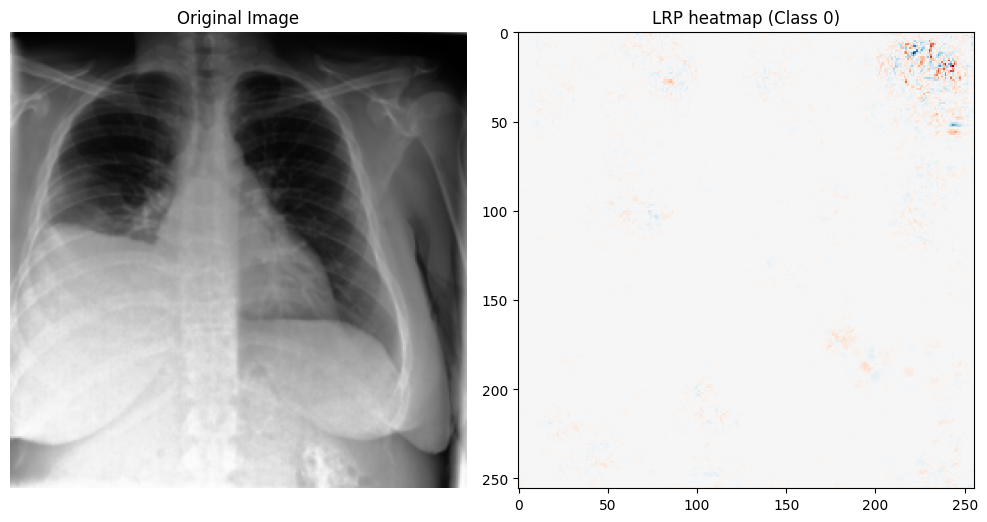

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


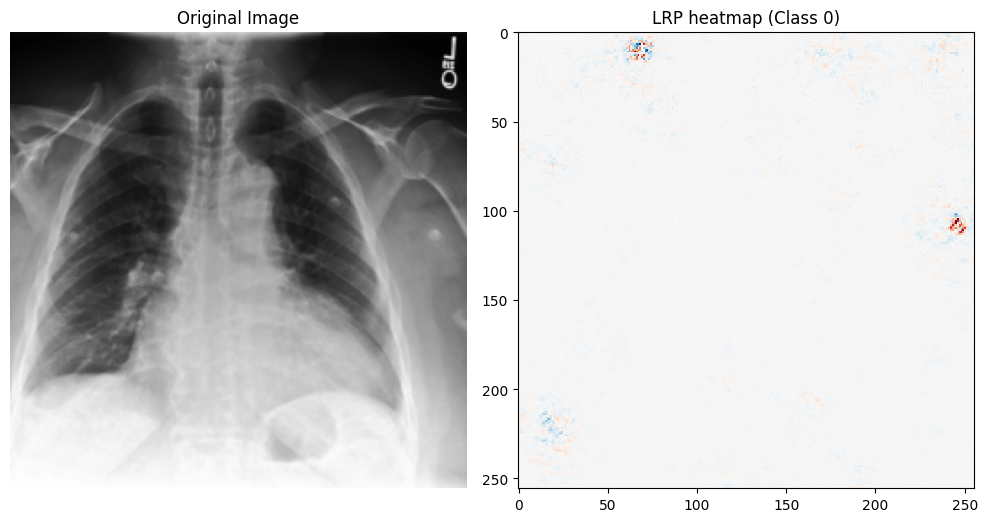

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


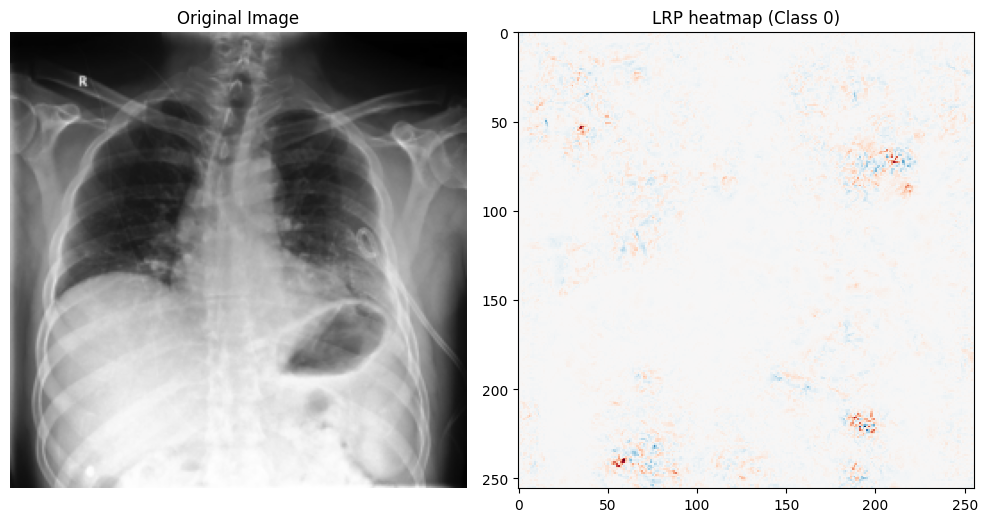

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


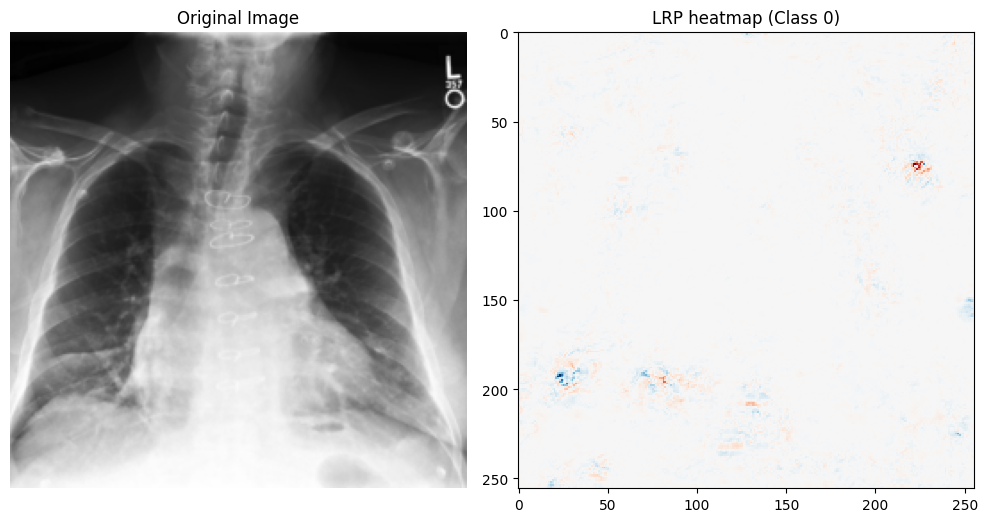

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


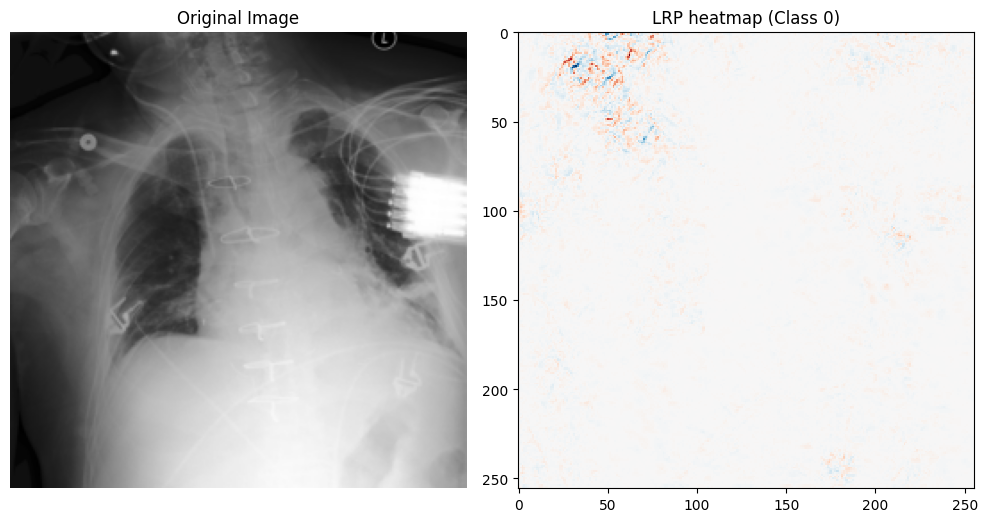

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


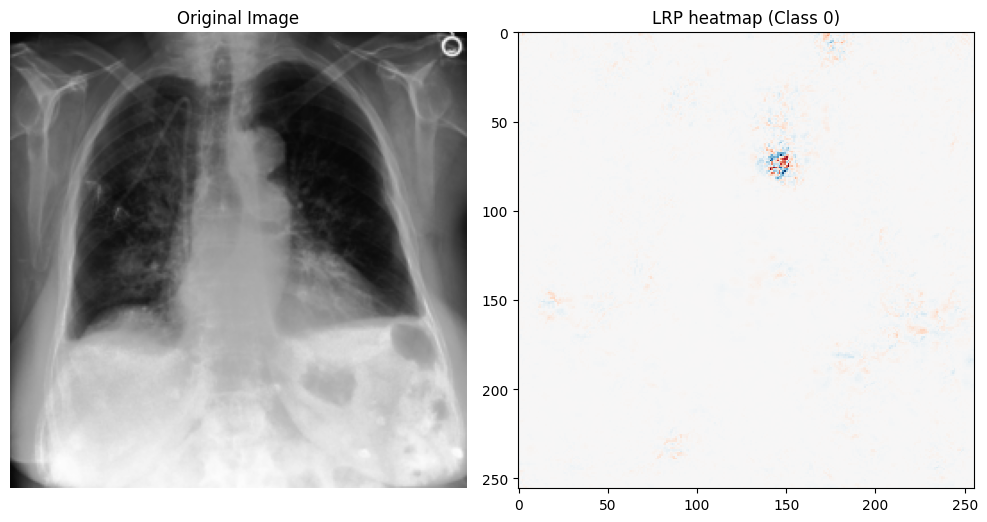

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


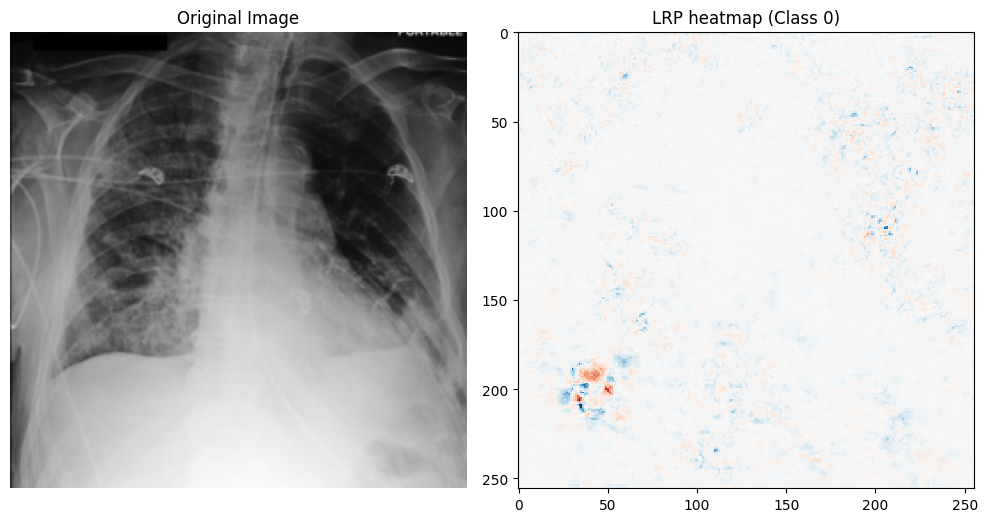

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


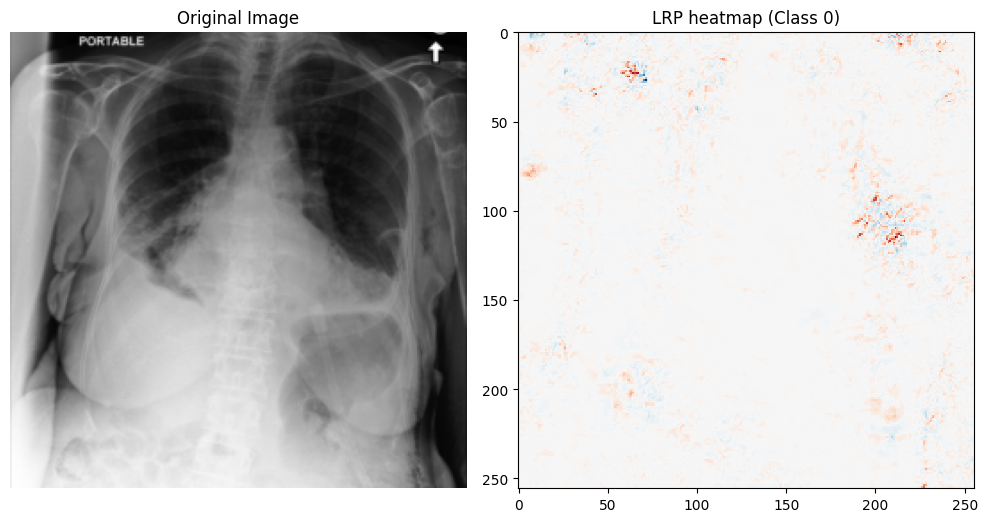

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


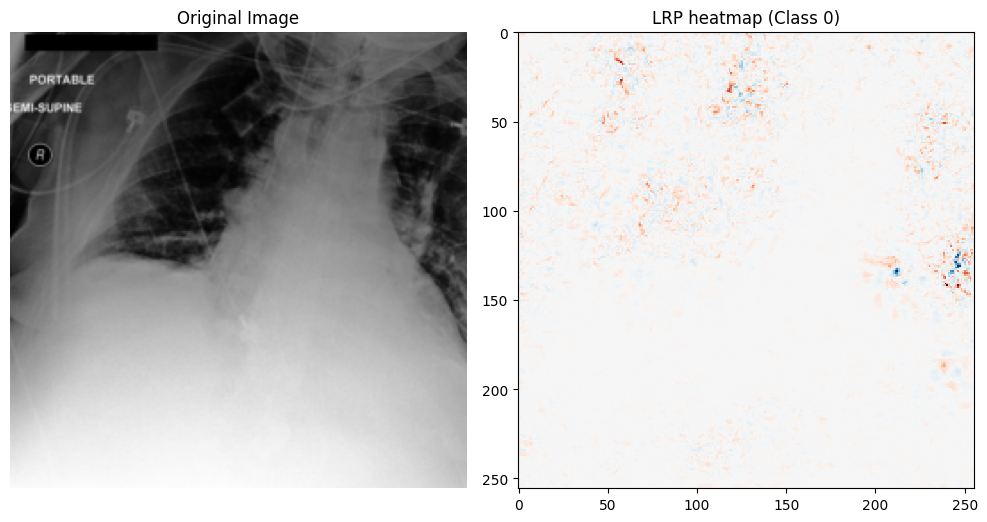

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


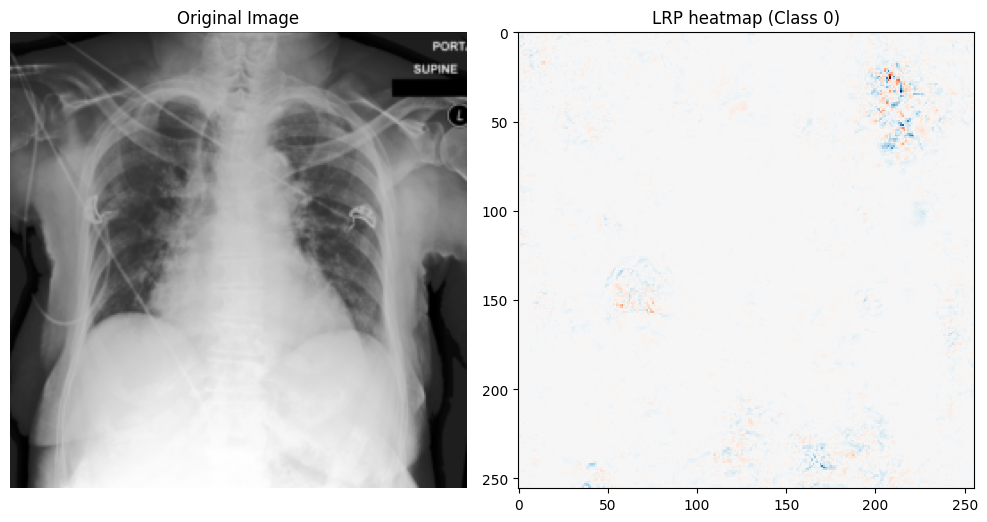

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


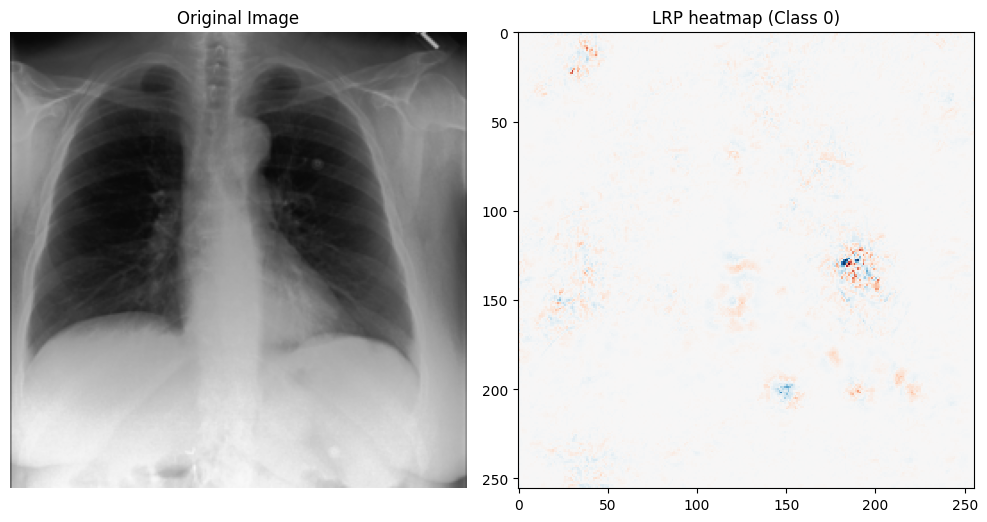

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


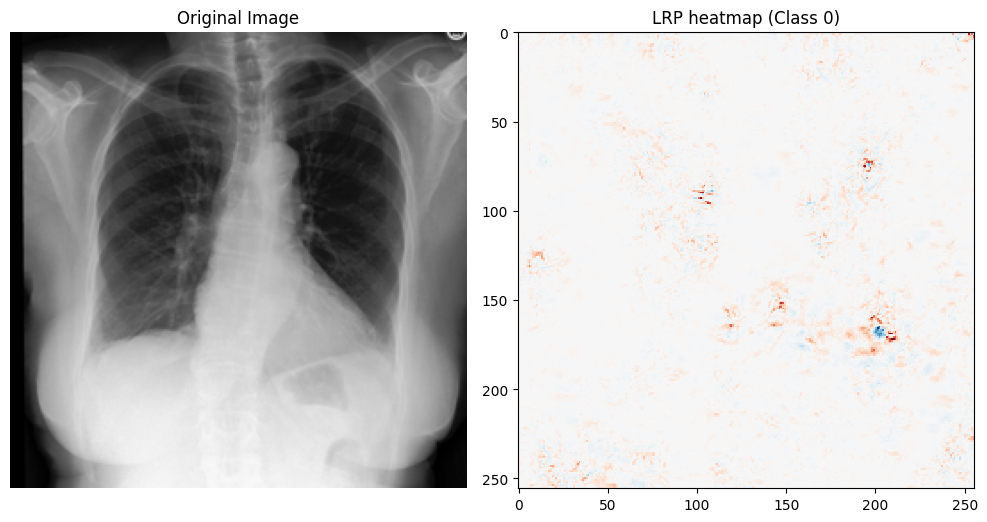

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


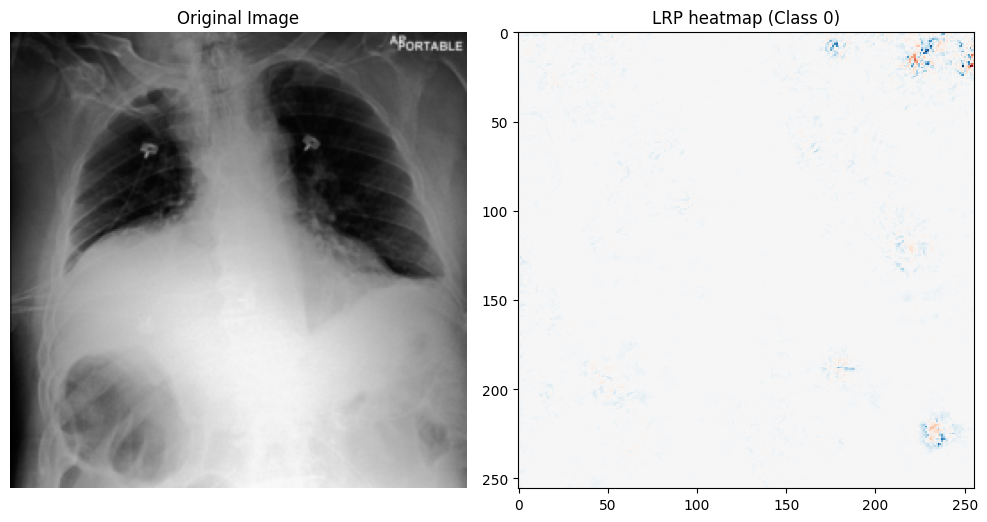

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


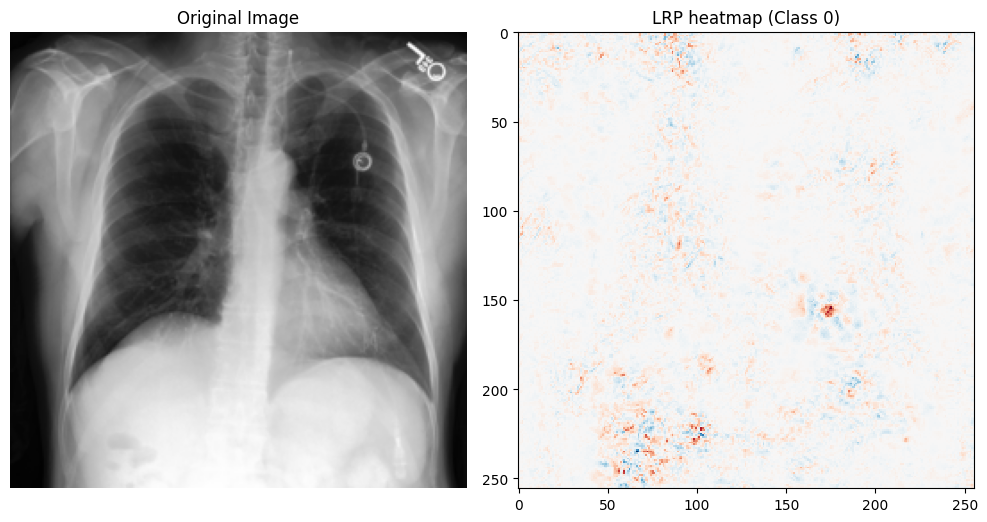

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


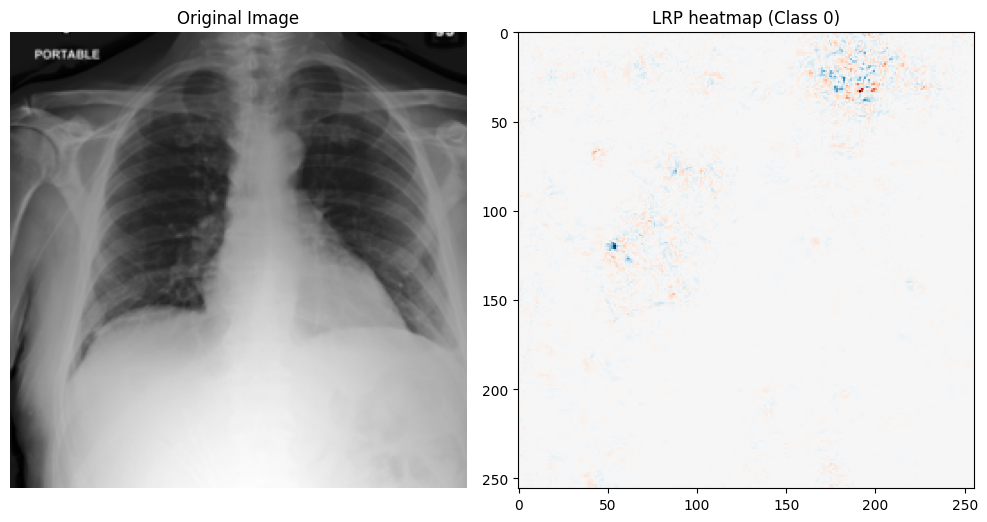

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


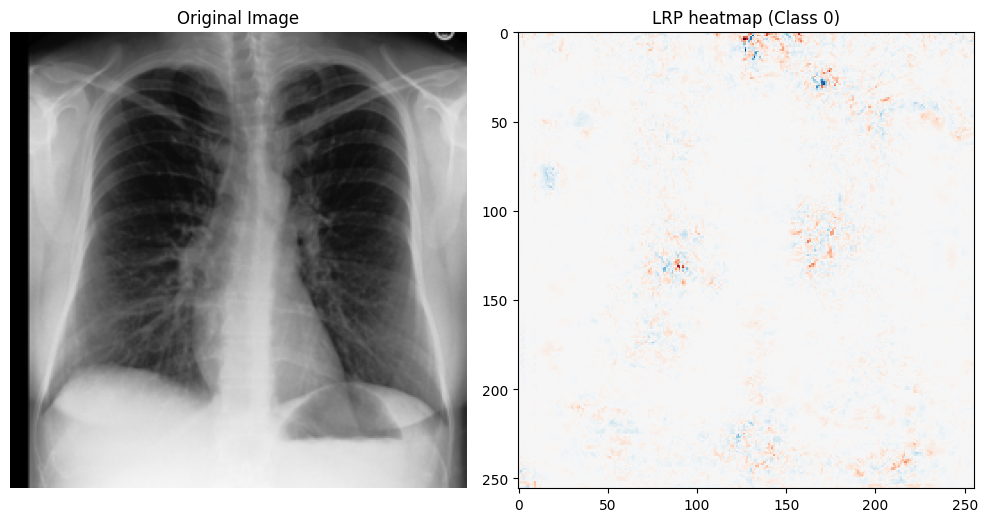

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


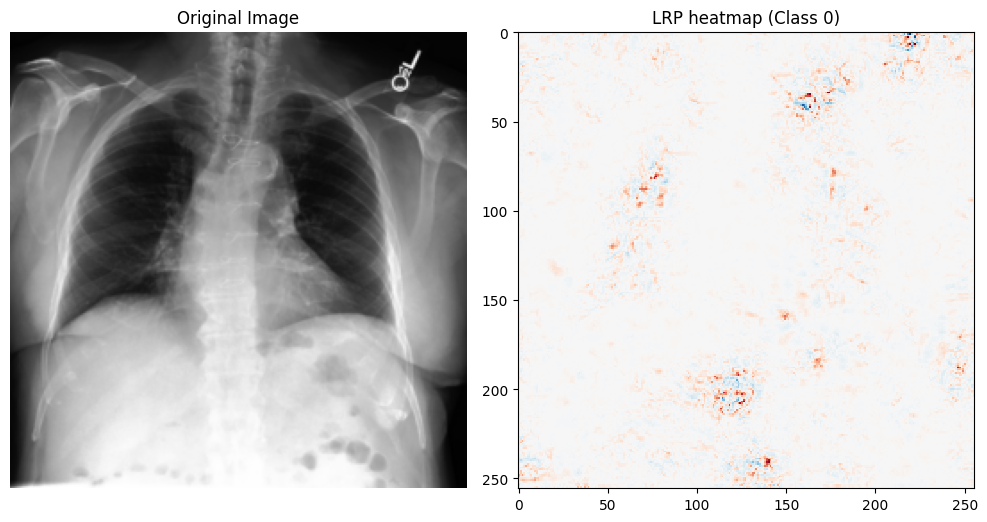

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


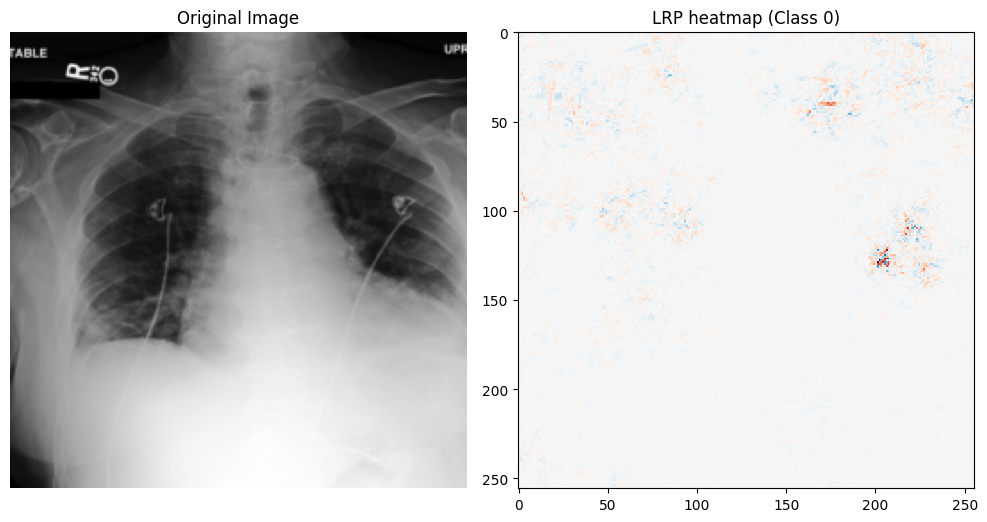

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


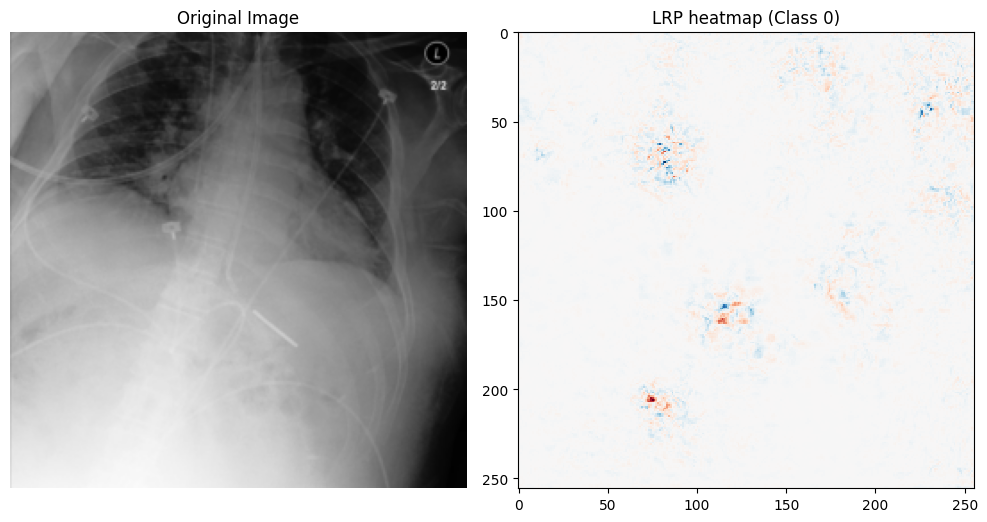

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


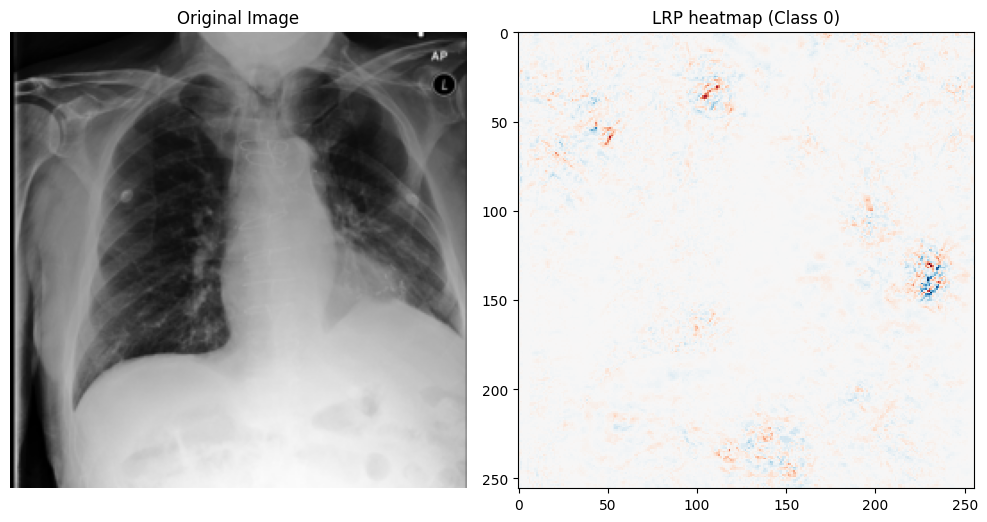

In [33]:
for index, row in df_no_finding.iterrows():
    img_path = row['path']
    LRPFlex_visualize(img_path, densenet_w_ERM, ex_class=0)


In [ ]:
#---------Apply LRP Flex ERM

In [ ]:
#---------Apply LRP Flex ISNetDANN

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


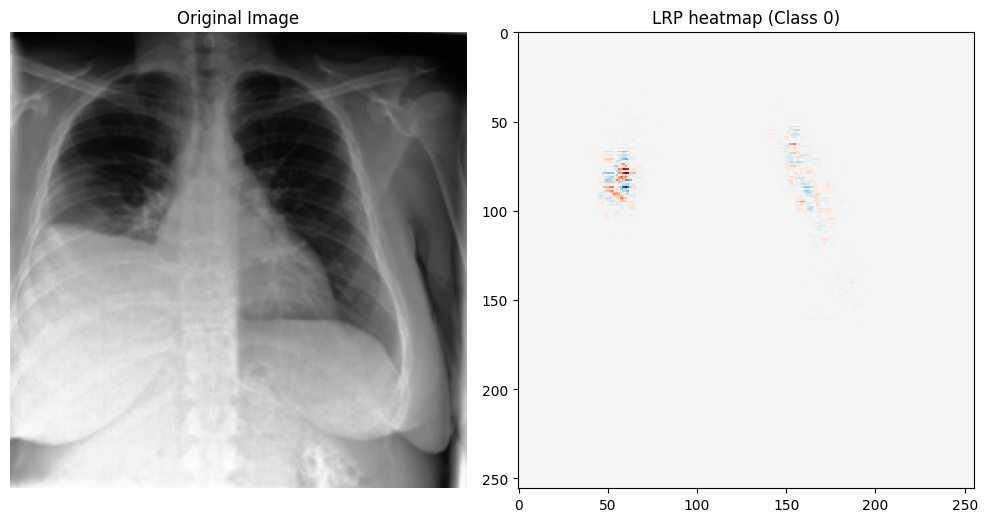

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


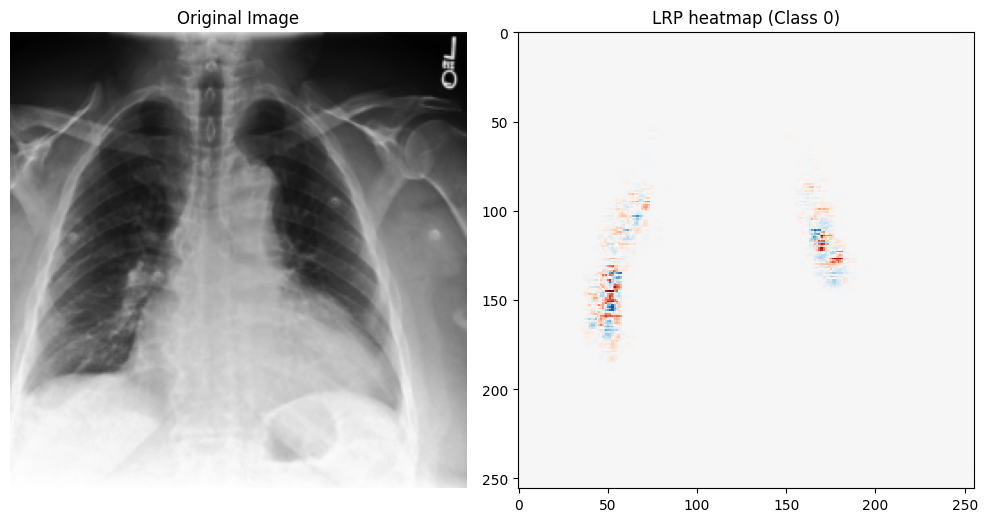

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


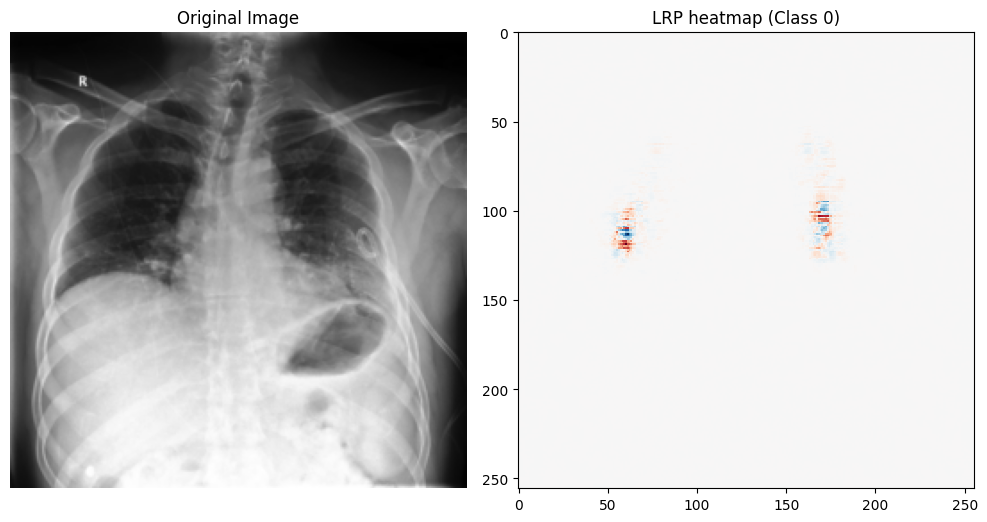

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


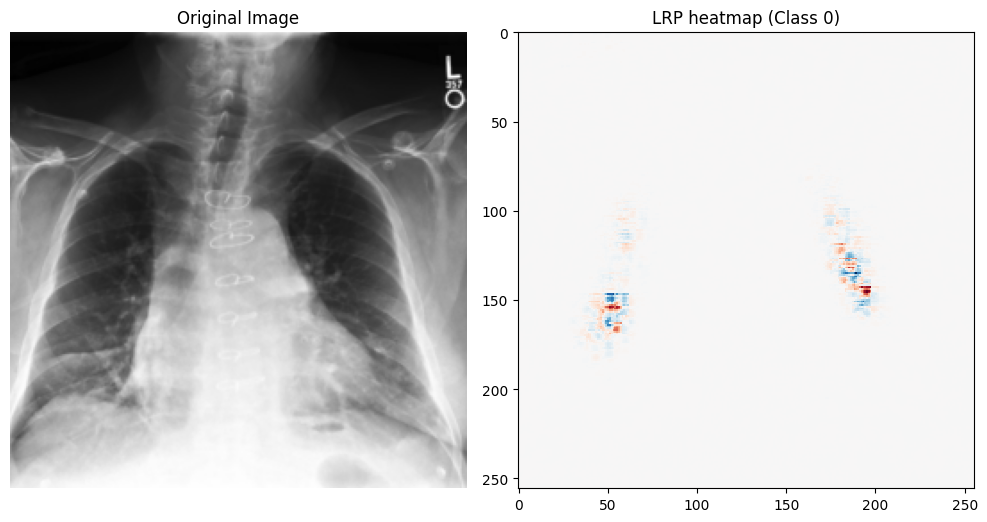

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


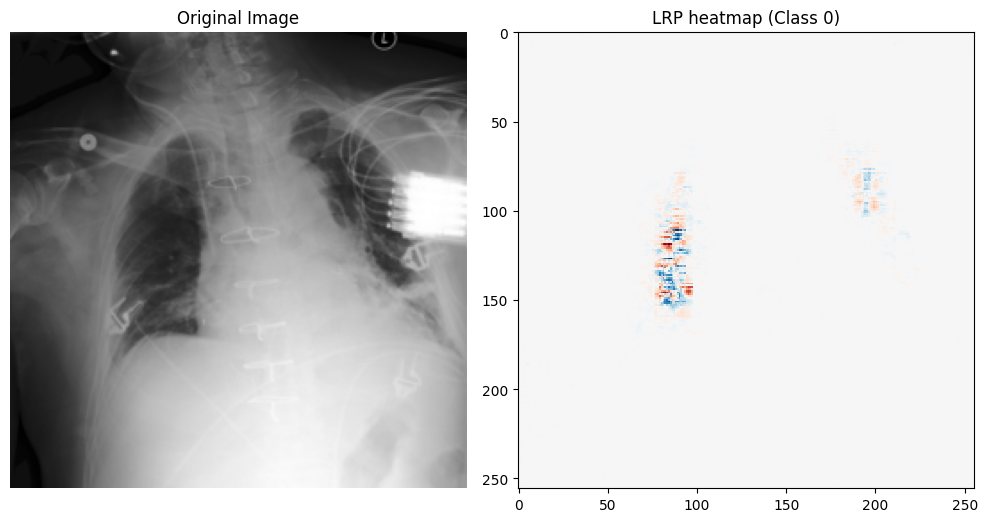

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


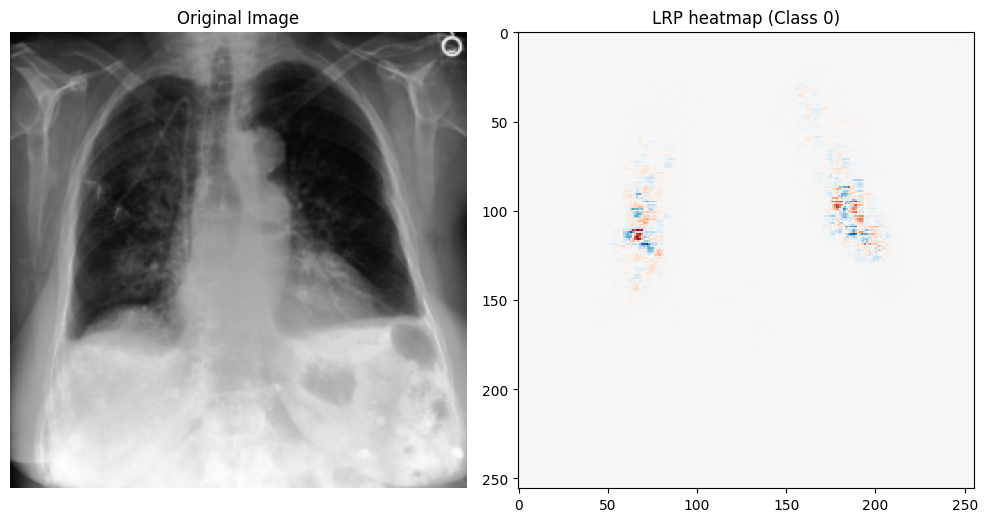

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


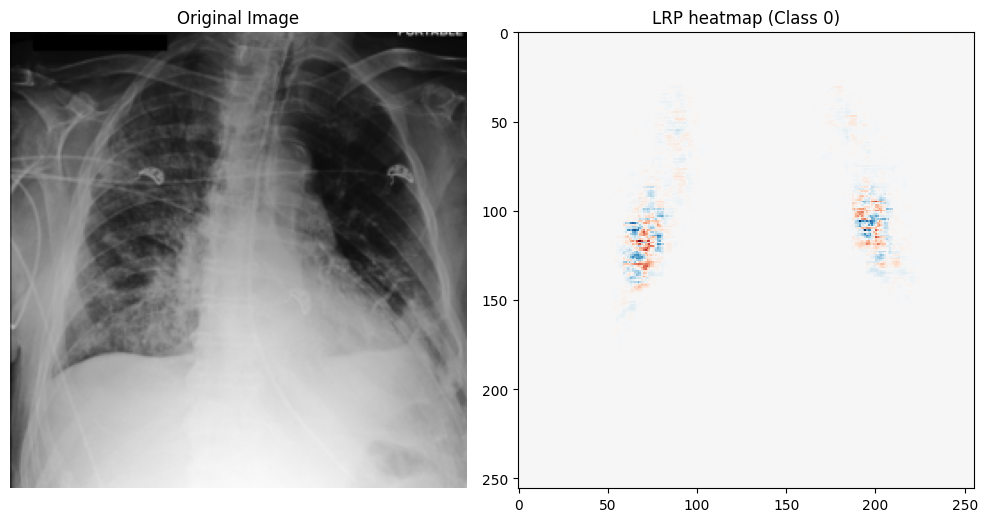

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


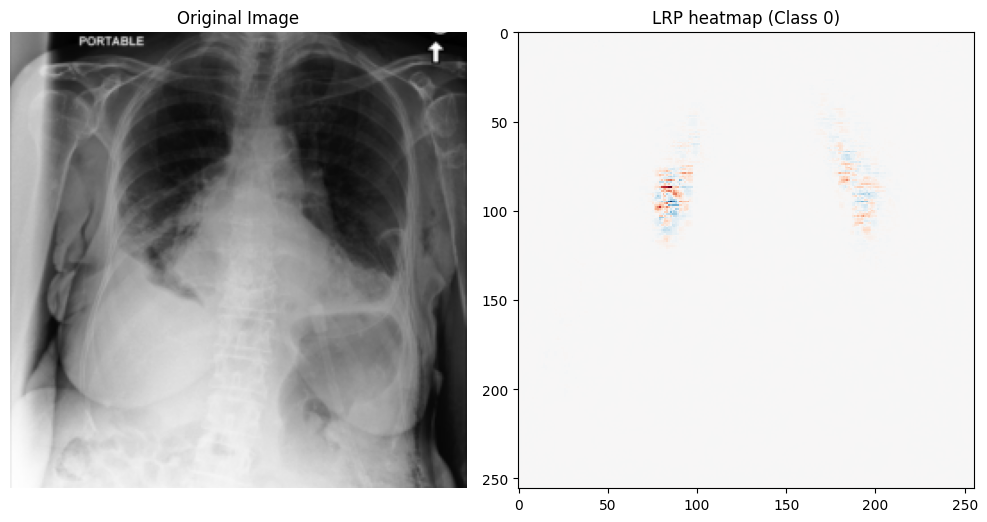

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


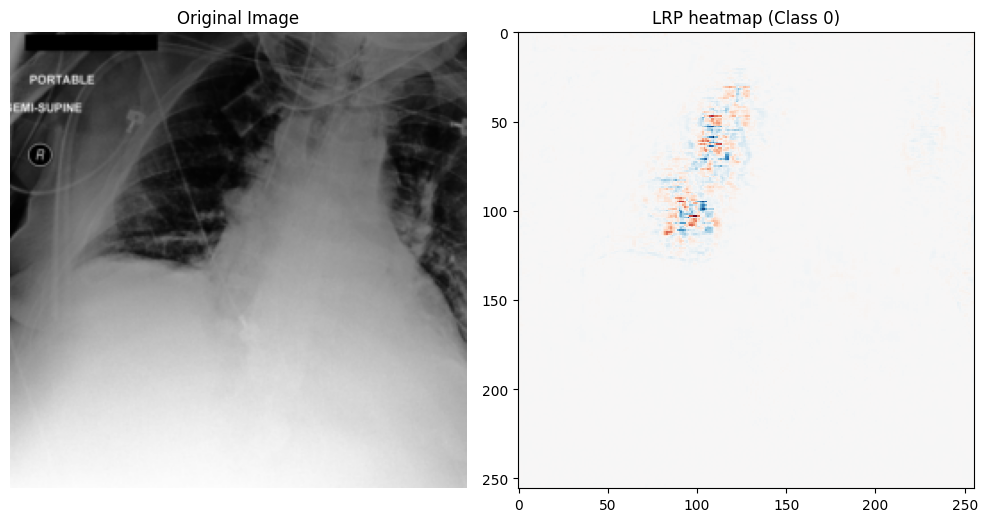

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


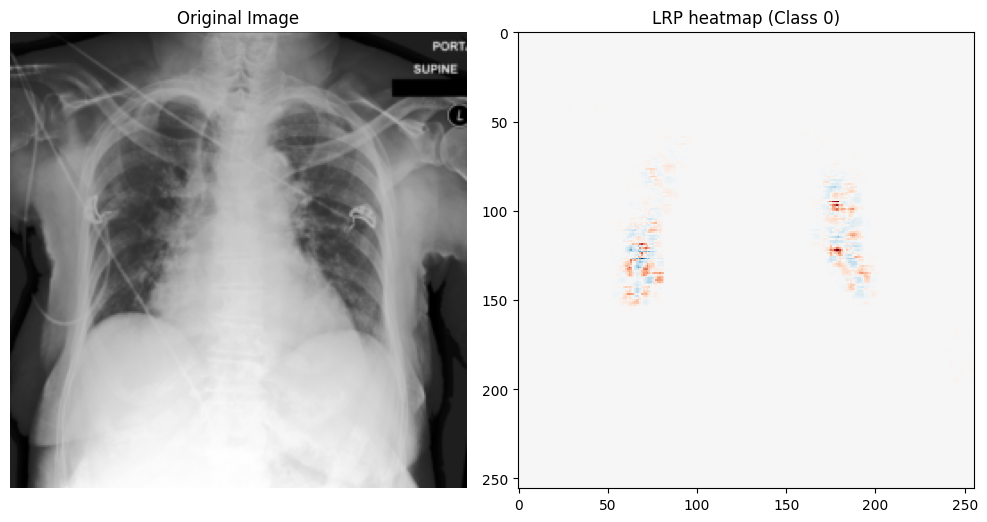

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


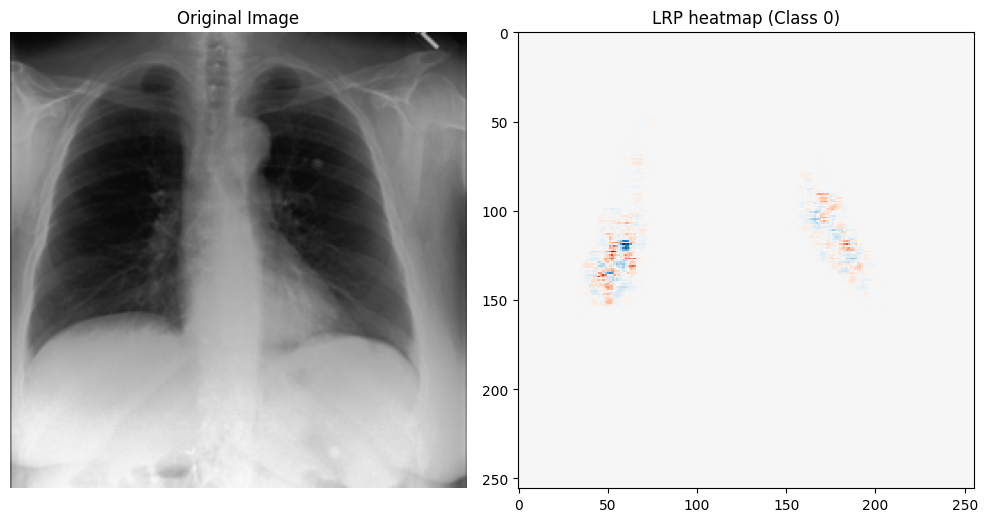

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


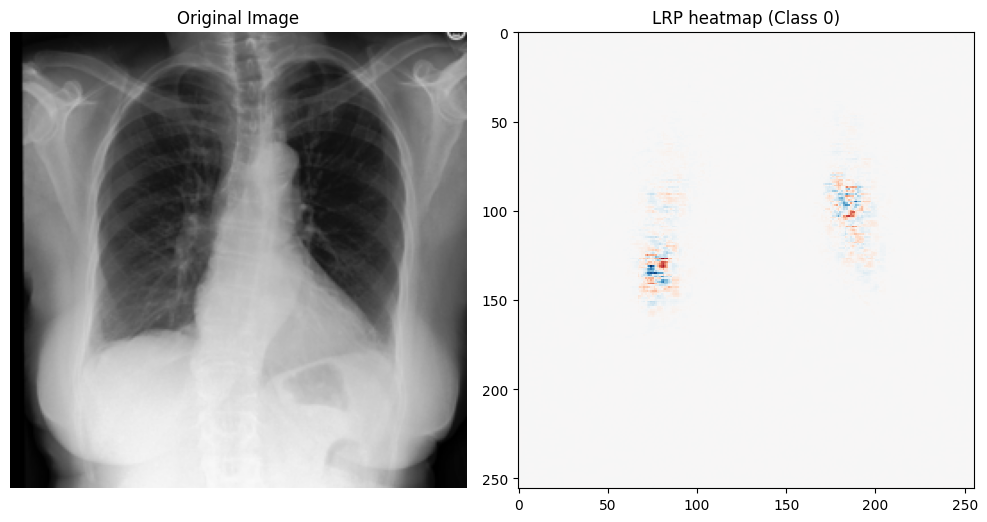

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


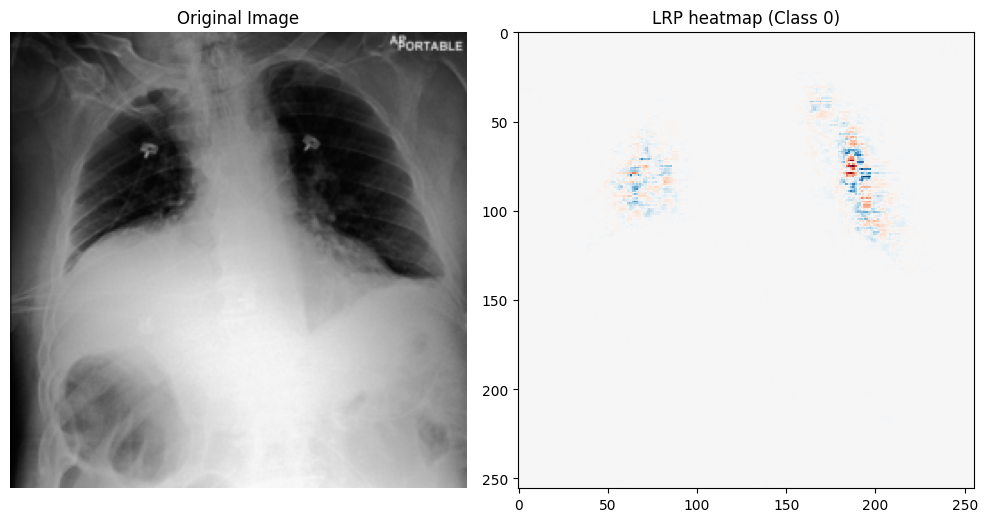

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


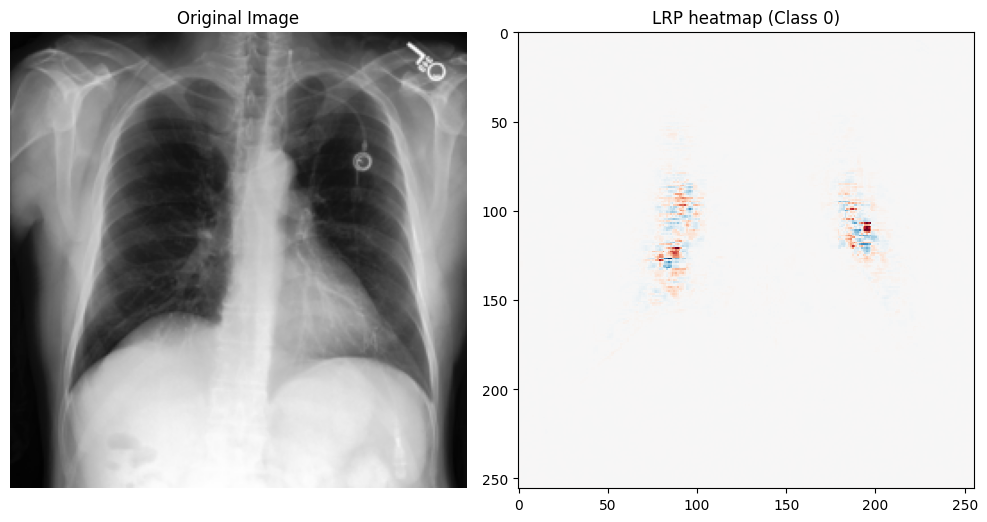

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


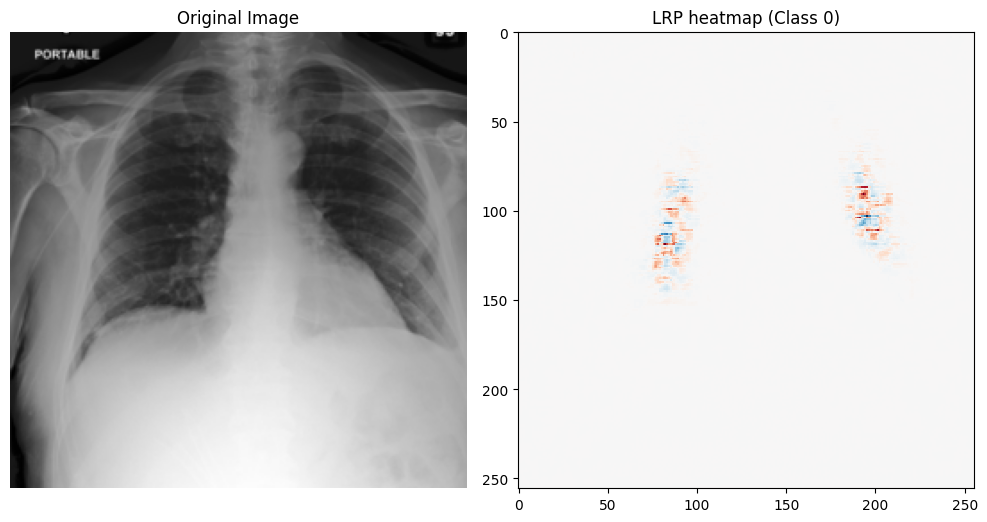

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


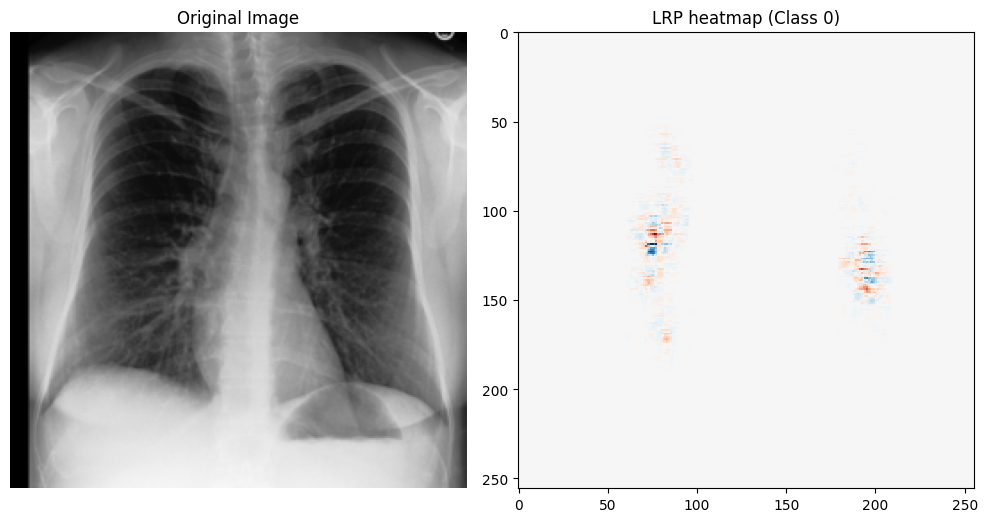

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


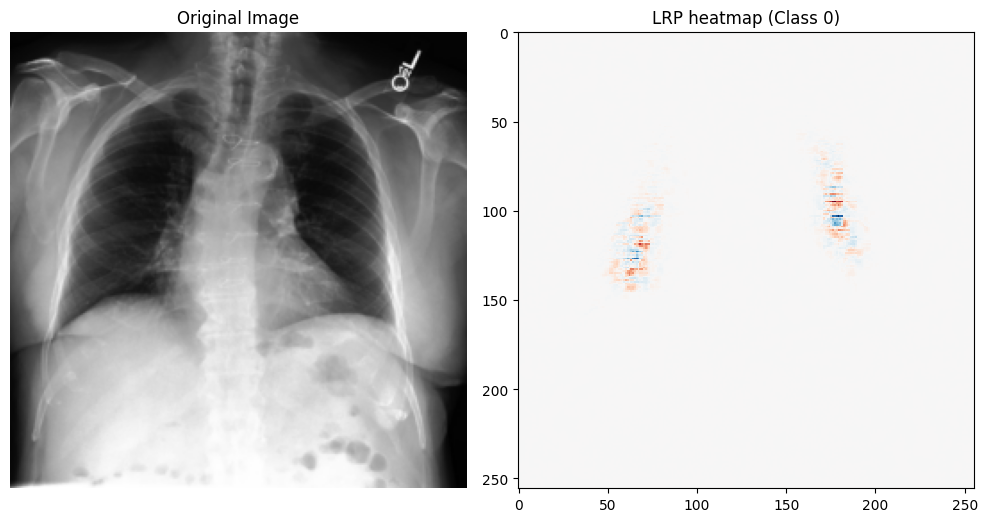

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


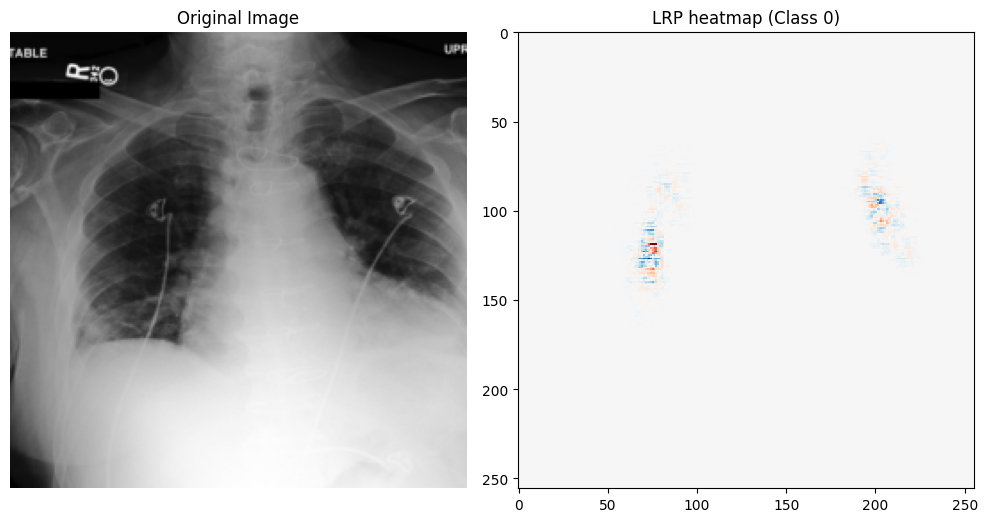

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


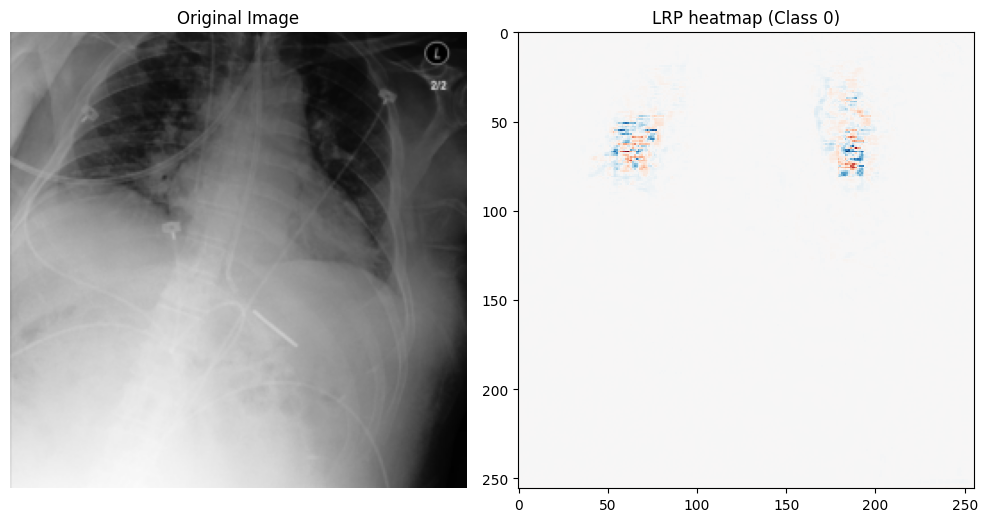

Using custom model. Ensure that ReLU layers are not re-utilized inside the model and avoid in-place operations
[Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False), BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True), ReLU()]


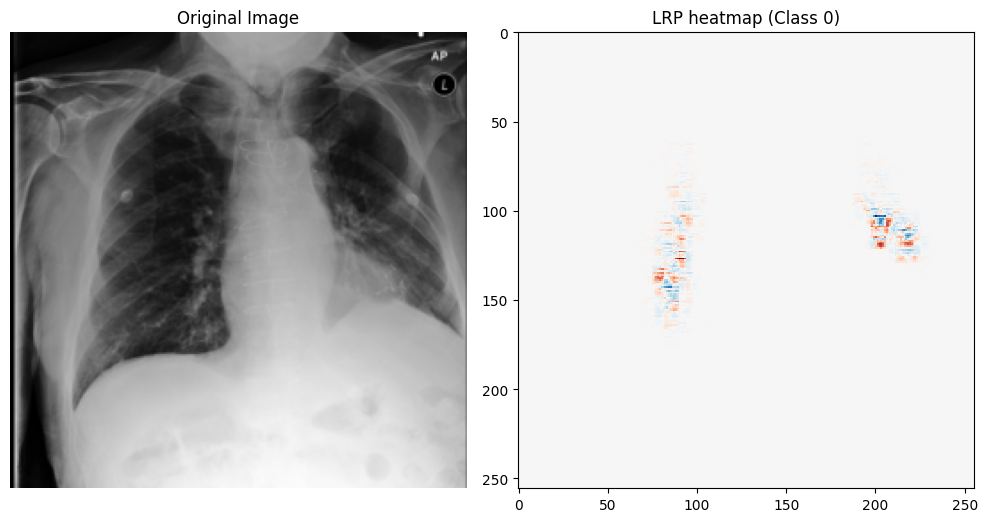

In [34]:
for index, row in df_no_finding.iterrows():
    img_path = row['path']
    LRPFlex_visualize(img_path, densenet_w_ISNetDANN, ex_class=0)


In [ ]:
#---------Apply LRP Flex ISNetDANN

In [ ]:
#-----LRP Flex proposed in Faster ISNets for visualization-------